# Gaussian Processes in Julia with Stheno

In [1]:
# Theoretical background to go here (and probs for parts of the content)

In [2]:
using Pkg
Pkg.add("Stheno")

  Updating registry at `~/.julia/registries/General`
  Updating git-repo `https://github.com/JuliaRegistries/General.git`
 Resolving package versions...
  Updating `~/.julia/environments/v1.2/Project.toml`
 [no changes]
  Updating `~/.julia/environments/v1.2/Manifest.toml`
 [no changes]


In [3]:
Pkg.add("AdvancedHMC")

 Resolving package versions...
  Updating `~/.julia/environments/v1.2/Project.toml`
 [no changes]
  Updating `~/.julia/environments/v1.2/Manifest.toml`
 [no changes]


In [4]:
using Stheno, Plots, Optim

## 1. Construct a first Gaussian process

In [5]:
# Choose the length-scale and variance of the process
l = 0.4
σ² = 1.3;

In [6]:
# Construct a kernel
k = σ² * stretch(matern52(), 1 / l)

# Construct a zero-mean GP with the kernel
f = GP(k, GPC());

In [7]:
# Generate a sample from the GP
const x = randn(100)
σ²_n = 0.05
fx = f(x, σ²_n)
const y = rand(fx);

In [8]:
# Compute the log marginal likelihood for this observation
logpdf(fx, y)

-25.755737207238518

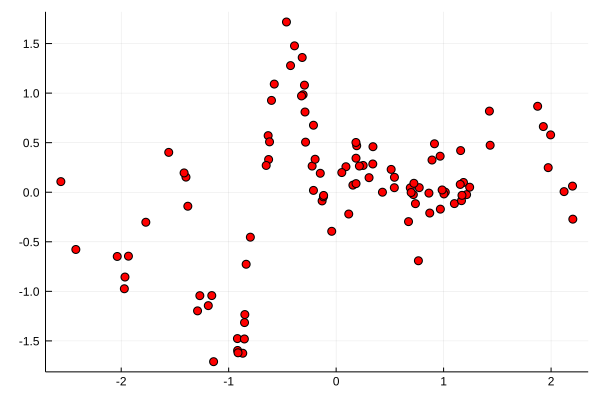

In [9]:
# Visualize the GP
using Plots

plt = plot();
scatter!(plt, x, y; color=:red, label="");
display(plt);

In [10]:
# Compute the posterior over f
f_posterior = f | Obs(fx, y);

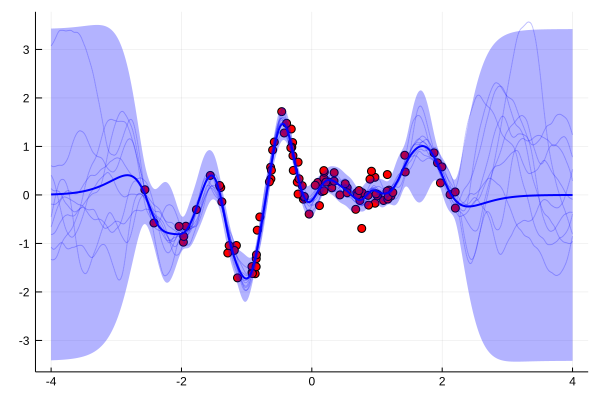

In [11]:
# Visualize the posterior
x_plot = range(-4.0, 4.0; length=1000);
plot!(plt, f_posterior(x_plot); samples=10, label="", color=:blue);
display(plt);

## 2. GP regression using Stheno's low-level API

In [12]:
# -- explanation to go here --
function unpack(θ)
    σ² = exp(θ[1]) + 1e-6
    l = exp(θ[2]) + 1e-6
    σ²_n = exp(θ[3]) + 1e-6
    return σ²,l, σ²_n
end

# negative log marginal likelihood of θ
function nlml(θ)
    σ², l, σ²_n = unpack(θ)
    k = σ² * stretch(matern52(), 1 / l)
    f = GP(k, GPC())
    return -logpdf(f(x, σ²_n), y)
end;

In [13]:
# Set up optimization problem
θ0 = randn(3);
results = Optim.optimize(nlml, θ0, NelderMead())
σ²_ml, l_ml, σ²_n_ml = unpack(results.minimizer);

In [14]:
# Construct the posterior GP
k = σ²_ml * stretch(matern52(), 1 / l_ml);
f = GP(k, GPC());
f_posterior_ml = f | Obs(f(x, σ²_n_ml), y);
plot!(plt, f_posterior_ml(x_plot); samples=10, color=:green, label="");
display(plt);

## 3. GP fitting with BFGS using Zygote.jl

In [15]:
using Zygote: gradient

# Set up the optimization
θ0 = randn(3)
results = Optim.optimize(nlml, θ->gradient(nlml, θ)[1], θ0, BFGS(); inplace=false)
σ²_bfgs, l_bfgs, σ²_n_bfgs = unpack(results.minimizer);

In [16]:
k = σ²_bfgs * stretch(matern52(), 1 / l_bfgs);
f = GP(k, GPC());
f_posterior_bfgs = f | Obs(f(x, σ²_n_bfgs), y);
plot!(plt, f_posterior_bfgs(x_plot); samples=10, color=:purple, label="");
display(plt);

## 4. Approximate Bayesian inference of the GP's hyperparameters

In [17]:
using AdvancedHMC, Zygote

In [18]:
# Define the log marginal likelihood function and its gradient
lπ(θ) = -nlml(θ)
function dlπdθ(θ)
    lml, back = Zygote.pullback(lπ, θ)
    dθ = first(back(1.0))
    return lml, dθ
end;

In [19]:
# Sampling parameter settings
n_samples, n_adapts = 100, 20

# Draw random starting points
θ0 = randn(3);

In [20]:
# Define metric space, Hamiltonian, sampling method and adaptor
metric = DiagEuclideanMetric(3)
h = Hamiltonian(metric, lπ, dlπdθ)
int = Leapfrog(find_good_eps(h, θ0))
prop = NUTS{MultinomialTS, GeneralisedNoUTurn}(int)
adaptor = StanHMCAdaptor(n_adapts, Preconditioner(metric), NesterovDualAveraging(0.8, int.ϵ));

┌ Warning: `StanHMCAdaptor(n_adapts, pc, ssa)` is deprecated, use `initialize!(StanHMCAdaptor(pc, ssa), n_adapts)` instead.
│   caller = top-level scope at In[20]:6
└ @ Core In[20]:6


In [21]:
# Perform inference
samples, stats = sample(h, prop, θ0, n_samples, adaptor, n_adapts; progress=true);

Sampling  1%|▎                              |  ETA: 0:02:50
  iterations:                    1
  n_steps:                       1
  is_accept:                     true
  acceptance_rate:               0.0
  log_density:                   -129.4878272435883
  hamiltonian_energy:            130.30928372919044
  hamiltonian_energy_error:      0.0
  max_hamiltonian_energy_error:  4.223670919443038e9
  tree_depth:                    0
  numerical_error:               true
  step_size:                     0.8
  nom_step_size:                 0.8
  is_adapt:                      true
4m  mass_matrix:                   DiagEuclideanMetric([1.0, 1.0, 1.0])













Sampling 13%|████                           |  ETA: 0:00:16
  iterations:                    13
  n_steps:                       15
  is_accept:                     true
  acceptance_rate:               0.9968216283893842
  log_density:                   -27.181325107967126
  hamiltonian_energy:            29.52698165456035
  ham

4m  mass_matrix:                   DiagEuclideanMetric([1.0, 1.0, 1.0])













Sampling 41%|████████████▊                  |  ETA: 0:00:05
  iterations:                    41
  n_steps:                       7
  is_accept:                     true
  acceptance_rate:               0.9149679047582239
  log_density:                   -27.01092185998953
  hamiltonian_energy:            27.397033464388585
  hamiltonian_energy_error:      0.12320291436475728
  max_hamiltonian_energy_error:  0.16748038614675664
  tree_depth:                    2
  numerical_error:               false
  step_size:                     0.08986878291293433
  nom_step_size:                 0.08986878291293433
  is_adapt:                      false
4m  mass_matrix:                   DiagEuclideanMetric([1.0, 1.0, 1.0])













Sampling 44%|█████████████▋                 |  ETA: 0:00:05
  iterations:                    44
  n_steps:                       15
  is_accept:                     true
  acceptan

4m  mass_matrix:                   DiagEuclideanMetric([1.0, 1.0, 1.0])













Sampling 70%|█████████████████████▊         |  ETA: 0:00:02
  iterations:                    70
  n_steps:                       15
  is_accept:                     true
  acceptance_rate:               0.9383104278775561
  log_density:                   -27.924159035980615
  hamiltonian_energy:            29.05366352132218
  hamiltonian_energy_error:      -0.004012915469026268
  max_hamiltonian_energy_error:  0.1294895634214015
  tree_depth:                    4
  numerical_error:               false
  step_size:                     0.08986878291293433
  nom_step_size:                 0.08986878291293433
  is_adapt:                      false
4m  mass_matrix:                   DiagEuclideanMetric([1.0, 1.0, 1.0])













Sampling 73%|██████████████████████▋        |  ETA: 0:00:02
  iterations:                    73
  n_steps:                       23
  is_accept:                     true
  accept

4m  mass_matrix:                   DiagEuclideanMetric([1.0, 1.0, 1.0])













Sampling100%|███████████████████████████████| Time: 0:00:05
  iterations:                    100
  n_steps:                       7
  is_accept:                     true
  acceptance_rate:               0.8874897128271154
  log_density:                   -25.8095650313944
  hamiltonian_energy:            31.968176971628147
  hamiltonian_energy_error:      -0.0770156972658711
  max_hamiltonian_energy_error:  0.26040976488263823
  tree_depth:                    3
  numerical_error:               false
  step_size:                     0.08986878291293433
  nom_step_size:                 0.08986878291293433
  is_adapt:                      false
  mass_matrix:                   DiagEuclideanMetric([1.0, 1.0, 1.0])
┌ Info: Finished 100 sampling steps for 1 chains in 6.023534676 (s)
│   h = Hamiltonian(metric=DiagEuclideanMetric([1.0, 1.0, 1.0]))
│   τ = NUTS{MultinomialTS,Generalised}(integrator=Leapfrog(ϵ=

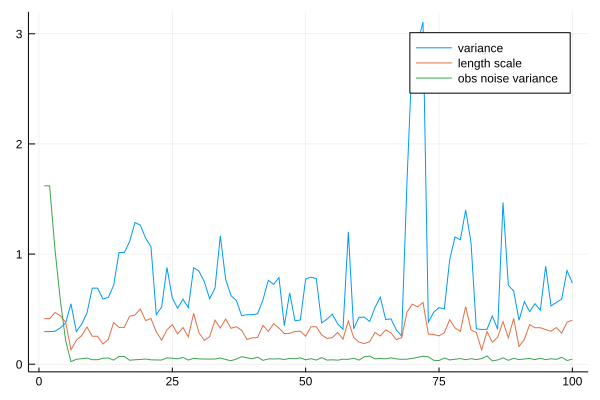

In [24]:
# Inspect posterior distribution
hypers = unpack.(samples);
plt_hypers = plot();
plot!(plt_hypers, getindex.(hypers, 1); label="variance");
plot!(plt_hypers, getindex.(hypers, 2); label="length scale");
plot!(plt_hypers, getindex.(hypers, 3); label="obs noise variance");
display(plt_hypers);

## 5. Exercise

In [23]:
# - Play around with the available kernels
# - How do the different kernels affect the posterior in an approximate Bayesian inference setting?
# - Do we need more samples for an accurate posterior?

## 6. Learning kernels of Gaussian processes (Bayesian Nonparametrics)